# **Bag-of-visual-words for Image Classification**

**Steps:**
1.   Feature Extraction;
2.   Codebook formation;
3.   Image features quantization (exercise);                 
4.   Histogram of visual words (exercise);
5.   Classification (NN/k-NN/SVM) (exercise).             


In [ ]:
%%capture
# Update OpenCV package
!pip install -U opencv-python

In [ ]:
%%capture
# Import images from a zip file
!unzip 4_ObjectCategories.zip
# !unzip 15_ObjectCategories.zip

In [ ]:
# Import libraries
import os
import cv2
import sklearn
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
np.random.seed(8)

## **Dataset preparation**

* Import images (for each label select 50 images for training and 30 for testing).

In [ ]:
# Load images
print("Loading images...\n")
images_folder = './4_ObjectCategories'
# images_folder = './15_ObjectCategories'

# List of training images per label (1st index -> label, 2nd index -> image)
train_images = []
# List of testing images per label (1st index -> label, 2nd index -> image)
test_images = []

# Order labels by name
labels = sorted(os.listdir(images_folder))

n = 0
# For each label
for label in labels:
  images_path = os.path.join(images_folder, label)
  # Select a subset of images (50 for training and 30 for testing)
  n_train = 50
  n_test = 30 if len(os.listdir(images_path)) >= 80 else len(os.listdir(images_path)) - n_train
  idx_train_test = np.random.choice(len(os.listdir(images_path)), n_train + n_test, replace=False)
  train_files = [os.listdir(images_path)[idx] for idx in idx_train_test[:n_train]]
  test_files = [os.listdir(images_path)[idx] for idx in idx_train_test[n_train:]]

  # List of images
  images_per_label = []
  print(f"Loading training images ({label})...")
  # For each image with label 'image_label'
  for image in train_files:
      img_path = os.path.join(images_path, image)
      # Convert images to RGB format
      img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
      # Append image to the current label list
      images_per_label.append(img)
      n += 1
  # Add current list of images to the train_images list
  train_images.append(images_per_label)

  # List of images
  images_per_label = []
  print(f"Loading testing images ({label})...")
  # For each image with label 'image_label'
  for image in test_files:
      img_path = os.path.join(images_path, image)
      # Convert images to RGB format
      img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
      # Append image to the current label list
      images_per_label.append(img)
      n += 1
  # Add current list of images to the train_images list
  test_images.append(images_per_label)

print(f"\n{n} images loaded!")
print(f"\nNumber of labels: {len(labels)}")
print("\nNumber of images/label:")
for idx in range(len(labels)):
  print(f"{labels[idx]}: train ({len(train_images[idx])}) -- test ({len(test_images[idx])})")

Loading images...

Loading training images (airplanes)...
Loading testing images (airplanes)...
Loading training images (cars)...
Loading testing images (cars)...
Loading training images (faces)...
Loading testing images (faces)...
Loading training images (motorbikes)...
Loading testing images (motorbikes)...

320 images loaded!

Number of labels: 4

Number of images/label:
airplanes: train (50) -- test (30)
cars: train (50) -- test (30)
faces: train (50) -- test (30)
motorbikes: train (50) -- test (30)


In [ ]:
# Let's create one vector for train/test images containing all the labels
# Create train labels vector
train_labels = []
for label in range(len(train_images)):
  for idx_image in range(len(train_images[label])):
    train_labels.append([label])
train_labels = np.concatenate(train_labels)
print(f"Train labels shape: {train_labels.shape}")

# Create test labels vector
test_labels = []
for label in range(len(test_images)):
  for idx_image in range(len(test_images[label])):
    test_labels.append([label])
test_labels = np.concatenate(test_labels)
print(f"Test labels shape: {test_labels.shape}")

Train labels shape: (200,)
Test labels shape: (120,)


In [ ]:
print("Train labels: ")
print(train_labels)
print("Test labels: ")
print(test_labels)

Train labels: 
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
Test labels: 
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3]


## **Feature Extraction**
Detect train/test keypoints/descriptors using the SIFT algorithm.

In [ ]:
# Create SIFT object
#sift = cv2.SIFT_create(sigma=0.5, contrastThreshold=0.001)
sift = cv2.SIFT_create(sigma=0.5, contrastThreshold=0.005)
USE_DENSE_SIFT = False # Set to True, if you want to use DENSE SIFT (see last part of the notebook)

In [ ]:
train_keypoints = []
train_descriptors = []

# Define two masks. 'label_mask' associates each kps/des to the corresponding label ID
# (this is the label of the class)
# while 'image_mask' associates each kps/des to the corresponding image ID
# (this is the labels of the image into the class)
label_mask_train = []
image_mask_train = []

# Extract SIFT features from training images
for idx_label, list_images in enumerate(train_images):
  # For each label
  label_kps = []
  label_des = []
  print(f"Processing training '{labels[idx_label]}' images...")
  for idx_image, image in enumerate(list_images):
    # Apply SIFT algorithm
    if USE_DENSE_SIFT:
      kps, des = DenseSIFT(sift, 5, 5).detectAndCompute(image)
    else:
      kps, des = sift.detectAndCompute(image, None)
    label_kps.append(kps)
    label_des.append(des)
    # Append to the lists
    label_mask_train.append(np.full(shape=(len(kps)), fill_value=idx_label))
    image_mask_train.append(np.full(shape=(len(kps)), fill_value=idx_image))

  train_keypoints.append(label_kps)
  train_descriptors.append(label_des)

label_mask_train = np.concatenate(label_mask_train)
image_mask_train = np.concatenate(image_mask_train)

Processing training 'airplanes' images...
Processing training 'cars' images...
Processing training 'faces' images...
Processing training 'motorbikes' images...


In [ ]:
for idx_label in range(len(train_images)):
  print(f"for label {labels[idx_label]}: {len(label_mask_train[np.where(label_mask_train==idx_label)])} training keypoints/descriptors")

for label airplanes: 246255 training keypoints/descriptors
for label cars: 440147 training keypoints/descriptors
for label faces: 229929 training keypoints/descriptors
for label motorbikes: 342560 training keypoints/descriptors


In [ ]:
print(f"Total number of training keypoints/descriptors: {label_mask_train.shape[0]}")

Total number of training keypoints/descriptors: 1258891


In [ ]:
# print number of keypoints per training image
#for idx_label, list_images in enumerate(train_images):
#  for idx_image, image in enumerate(list_images):
#    print(f"for image {idx_image}, label {labels[idx_label]}: {len(image_mask_train[np.where(image_mask_train==idx_image)])} training keypoints/descriptors")'''

In [ ]:
# Same operation for the testing images
test_keypoints = []
test_descriptors = []

# Define two masks. 'label_mask' associates each descriptor the the corresponding label ID
# while 'image_mask' associates each descriptor to the corresponding image ID
label_mask_test = []
image_mask_test = []

# Extract SIFT features from training images
for idx_label, list_images in enumerate(test_images):
  # For each label
  label_kps = []
  label_des = []
  print(f"Processing testing '{labels[idx_label]}' images...")
  for idx_image, image in enumerate(list_images):
    # Apply SIFT algorithm
    if USE_DENSE_SIFT:
      kps, des = DenseSIFT(sift, 5, 5).detectAndCompute(image)
    else:
      kps, des = sift.detectAndCompute(image, None)
    label_kps.append(kps)
    label_des.append(des)
    label_mask_test.append(np.full(shape=(len(kps)), fill_value=idx_label))
    image_mask_test.append(np.full(shape=(len(kps)), fill_value=idx_image))

  test_keypoints.append(label_kps)
  test_descriptors.append(label_des)

label_mask_test = np.concatenate(label_mask_test)
image_mask_test = np.concatenate(image_mask_test)

Processing testing 'airplanes' images...
Processing testing 'cars' images...
Processing testing 'faces' images...
Processing testing 'motorbikes' images...


In [ ]:
print(f"Total number testing of keypoints/descriptors: {label_mask_test.shape[0]}")

Total number testing of keypoints/descriptors: 776807


*  Plot keypoints of a random training image per label.

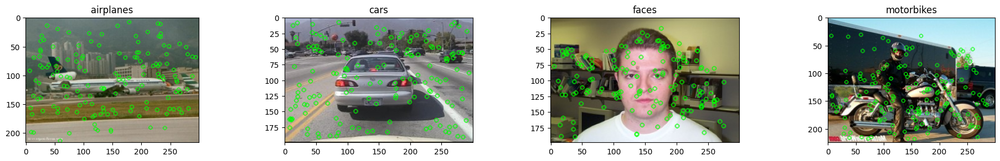

In [ ]:
# Plot keypoints
_ = plt.figure(figsize=(30,10))
for idx_label in range(len(labels)):
  # Extract random image
  idx_image = np.random.randint(0, len(train_images[idx_label]))
  img = train_images[idx_label][idx_image]
  # Get keypoints
  kps = train_keypoints[idx_label][idx_image]
  # Comment the following two lines of code to plot a subset of keypoints
  kps_idx = np.random.choice(len(kps), 150, replace=False) # Subset of kps
  kps = [kps[idx] for idx in kps_idx]
  _ = plt.subplot(3, 5, idx_label+1), plt.imshow(cv2.drawKeypoints(img, kps, None, color=(0,255,0))), plt.title(f"{labels[idx_label]}")

## **Codebook formation**

**K-Means clustering**

Clustering of training descriptors in order to obtain our 'visual' words. We apply the K-Means algorithm considering a fixed number of 'visual' words (e.g., 500). To reduce the amount of time for clustering thousands of descriptors, we will select a subset of descriptors (e.g., 40,000).

In [ ]:
# The lists "train_descriptors" and "test_descriptors" are nested
# Create a list containing all training descriptors
train_des = []
for idx_label in range(len(train_images)):
  for idx_image in range(len(train_images[idx_label])):
    train_des.append(train_descriptors[idx_label][idx_image])
train_des = np.concatenate(train_des) # [total_num_descriptors x 128]
print(f"Training descriptors: {train_des.shape}")

# Create a list containing all testing descriptors
test_des = []
for idx_label in range(len(test_images)):
  for idx_image in range(len(test_images[idx_label])):
    test_des.append(test_descriptors[idx_label][idx_image])
test_des = np.concatenate(test_des) # [total_num_descriptors x 128]
print(f"Testing descriptors: {test_des.shape}")

Training descriptors: (1258891, 128)
Testing descriptors: (776807, 128)


In [ ]:
# The lists "train_keypoints" and "test_keypoints" are nested
# Create a list containing all training keypoints
train_kps = []
for idx_label in range(len(train_images)):
  for idx_image in range(len(train_images[idx_label])):
    train_kps.append(train_keypoints[idx_label][idx_image])
train_kps = np.concatenate(train_kps) # [total_num_keypoints x 1]
print(f"Training keypoints: {train_kps.shape}")

# Create a list containing all testing keypoints
test_kps = []
for idx_label in range(len(test_images)):
  for idx_image in range(len(test_images[idx_label])):
    test_kps.append(test_keypoints[idx_label][idx_image])
test_kps = np.concatenate(test_kps) # [total_num_keypoints x 1]
print(f"Testing keypoints: {test_kps.shape}")

Training keypoints: (1258891,)
Testing keypoints: (776807,)


In [ ]:
# Select randomly 40,000 descriptors
n_descriptors = 40000 if train_des.shape[0] >= 40000 else train_des.shape[0]
rand_descriptors_idx = np.random.choice(train_des.shape[0], n_descriptors, replace=False)
k_means_input = train_des[rand_descriptors_idx]
print(f"Total number of selected training descriptors: {k_means_input.shape[0]}.")

Total number of selected training descriptors: 40000.


In [ ]:
%%time
# Build visual vocabulary
print("K-Means clustering...")
n_visual_words = 500 # (k=500)
kmeans = KMeans(n_clusters=n_visual_words, max_iter=50).fit(k_means_input)
# Two important attributs of k-means fitted estimator are 'kmeans.cluster_centers_' (coordinates of cluster centers)
# and 'kmeans.labels_' (labels of each point)
visual_words = kmeans.cluster_centers_
print(f"Visual words (shape): {visual_words.shape}")

K-Means clustering...
Visual words (shape): (500, 128)
CPU times: user 31.7 s, sys: 67.5 ms, total: 31.8 s
Wall time: 21.4 s


### **Visual Words Visualization**

We will visualize $5$ random visual words, i.e., all the corresponding patches.

**Steps**:

*   Fix size of retrieved patches (e.g., 30x30 pixels);
*   Select 5 random visual words;
*   Select the descriptors associated to the visual word (consider only the descriptors used as inputs to the K-Means clustering algorithm);
*   Retrieve the keypoints associated to the selected descriptors;
*   Extract a squared patch around the selected keypoints;
*   Plot all the extracted patches for the selected visual word.



Visual word n. 379 (101 patches)


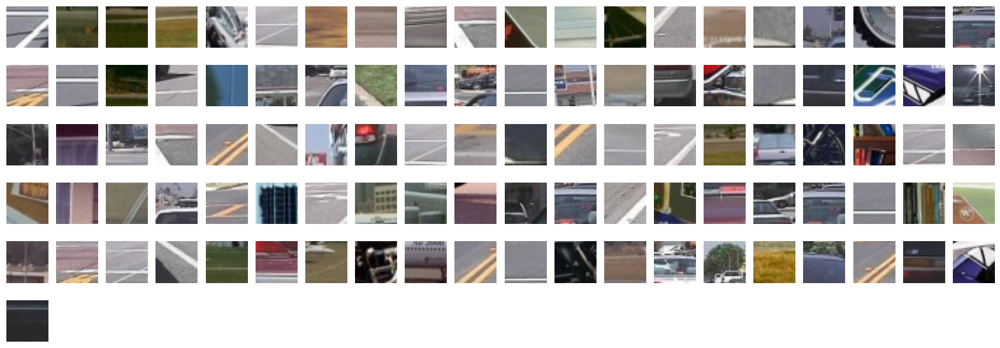


Visual word n. 76 (78 patches)


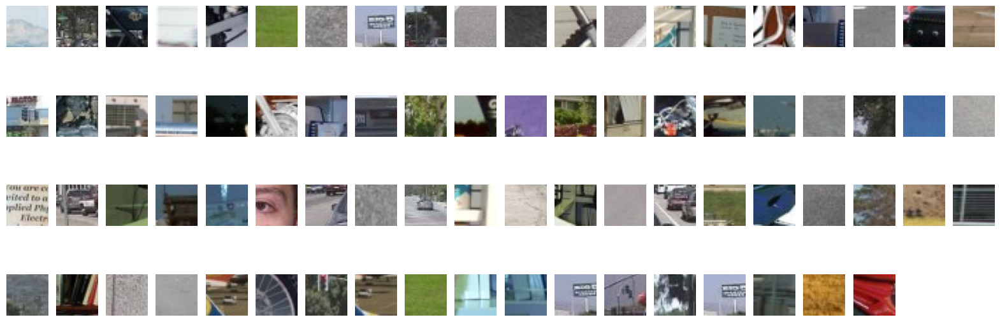


Visual word n. 104 (68 patches)


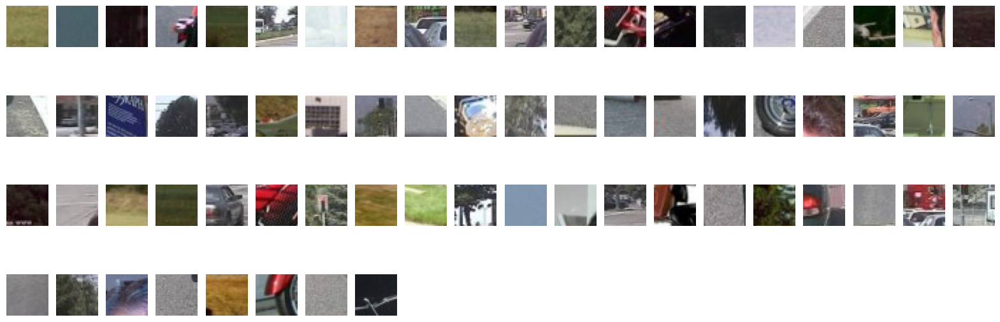


Visual word n. 394 (83 patches)


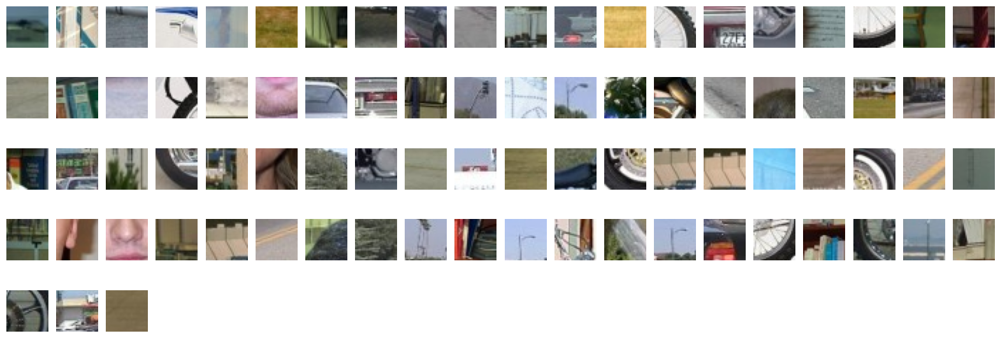


Visual word n. 311 (65 patches)


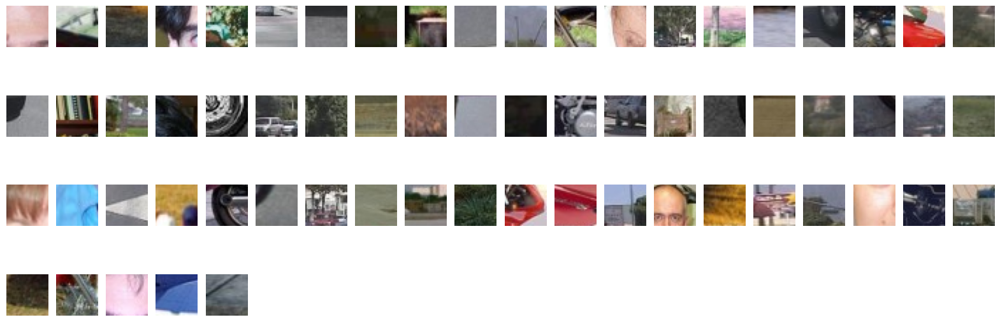

In [ ]:
# Patch size
patch_size = (30,30) # (width, height)

# Randomly select a visual word index
for idx_visual_word in np.random.choice(n_visual_words, 5, replace=False):
  # List of extracted patches
  patches = []

  # Select keypoints/descriptors' indices
  idx_des = rand_descriptors_idx[kmeans.labels_ == idx_visual_word] # Des/kps indices associated to the 'idx_visual_word' visual word.

  # Retrieve idx labels
  idx_labels = label_mask_train[idx_des]
  # Retrieve idx images
  idx_images = image_mask_train[idx_des]

  # For each descriptor
  for i in range(len(idx_labels)):
    # Retrieve keypoint
    kp = train_kps[idx_des[i]]

    # Retrieve keypoint's position
    points2f_kp	=	cv2.KeyPoint_convert([kp]).astype(int)[0]

    # Select associated image
    label = idx_labels[i]
    n_image = idx_images[i]
    img = train_images[label][n_image]

    # Extract a squared patch around the keypoint
    row_start = points2f_kp[1] - (patch_size[1]//2) if points2f_kp[1] - (patch_size[1]//2) >= 0 else 0
    row_end = points2f_kp[1] + (patch_size[1]//2) if points2f_kp[1] + (patch_size[1]//2) <= img.shape[0] else img.shape[0]

    col_start = points2f_kp[0] - (patch_size[0]//2) if points2f_kp[0] - (patch_size[0]//2) >= 0 else 0
    col_end = points2f_kp[0] + (patch_size[0]//2) if points2f_kp[0] + (patch_size[0]//2) <= img.shape[1] else img.shape[1]

    patches.append(cv2.resize(img[row_start:row_end, col_start:col_end], dsize=patch_size))

  # Plot cropped regions
  print(f"\nVisual word n. {idx_visual_word} ({len(idx_labels)} patches)")
  fig = plt.figure(figsize=(20, 7))
  for i in range(len(patches)):
    plt.subplot(int(np.ceil(len(patches)/20)), 20, int(i)+1), plt.imshow(patches[int(i)]), plt.axis('off') # Plot 20 patches per row
  plt.show()

## **Feature Quantization**

# **Ex. 1**

* **Feature Quantization**:	assign each feature	to	the	most representative visual word.

Implement the 'hard' assignment procedure which consists in associating each descriptor to the closest visual word. Perform this procedure for both training and testing descriptors. Create two lists (train_des_labels and test_des_labels) which associate each descriptor to the corresponding visual word.

**Steps**:
*  Compute Euclidean distances between each training descriptor and each visual word.
*  Detect the closest visual word to each descriptor.

Note that, if you apply your clustering algorithm using all the training descriptors (instead of a subset), you should only perform feature quantization for the testing images (all the training descriptors have already been associated to the closest visual word by the clustering algorithm),

In [ ]:
# Tips:
# Variables to use: train_des, test_des, visual_words

# For both training and testing descriptors:
# Step 1: Compute pairwise distance matrix (matrix size: n_of_descriptors x n_of_visual_words)
# Step 2: Find the closest visual word to each descriptor and save them into a variable named train_des_labels/test_des_labels

#############################
#                           #
#   WRITE YOUR CODE HERE    #
#                           #
#############################

print(f"train_des_labels shape: {train_des_labels.shape}")
print(f"test_des_labels shape: {test_des_labels.shape}")


train_des_labels shape: (1258891,)
test_des_labels shape: (776807,)


In [ ]:
print(train_des_labels[:10])
print(test_des_labels[:10])

[215  68  17  26 479  68 174 206  12 300]
[279 363  70 267  15 295 140 472 442 424]


## **Histograms of visual words**
# **Ex. 2**
Compute the histogram of visual words for each training image to train a classifier. The output should be in the same format as 'train_images'/'test_images' variables (i.e., a list of lists where the first index represents the label while the second one represents the image index.)

Repeat the same procedure to extract the histograms of visual words for the testing images.

* Use the following variables' names: 'bovw_train' and 'bovw_test'.

To compute a histogram, you may use "np.histogram(input, bins)" where bins is equal to the number of visual words.

In [ ]:
bovw_train = []

# Tips:
# Variables to use: train_images, label_mask_train, image_mask_train, train_des_labels, n_visual_words, bovw_train

# Step 1: Loop over training labels
# Step 2: Loop over images
# Step 3: Create a mask over all the descriptor labels of the training set to identify the ones associated to the image
#         (tip: use label_mask_train, image_mask_train and np.logical_and operator)
# Step 4: Retrieve labels of visual words associated to the selected descriptors
# Step 5: Create histogram of visual words for the considered image
# Step 6: Save current bovw into a variable "bovw_train"

#############################
#                           #
#   WRITE YOUR CODE HERE    #
#                           #
#############################

print(f"len(bovw_train): {len(bovw_train)}")
for label in range(len(bovw_train)):
 print(f"len(bovw_train[{label}]): {len(bovw_train[label])}")
print(f"\nbovw_train[0][0]:\n{bovw_train[0][0]}")

len(bovw_train): 4
len(bovw_train[0]): 50
len(bovw_train[1]): 50
len(bovw_train[2]): 50
len(bovw_train[3]): 50

bovw_train[0][0]:
[[23 25  3  7  3  8 17 18 12  5 25  6 19  3  7  4  6 43 13  4 16 10  4 25
   9  7 26  7 16 13  2  9  5  8  8 11 21 15  6 10  7  8 23  3  4  9 11  7
  12  9 10  2 12  8  5 24  9 13  2 30  1  5 15  4  4  6  4 10  5  4  2 12
  13  9 11 20  7  9  6  5  3  5 16 25  3 18  3 12  6  8 13 12 20 12  1  9
  18 10  0  5 47  5 11 11  7 13  3 10 13  5 12  7 22  4  7  6  6 16  8 34
  13  8  9 20  2 23 30  1  6  5  7 10 11  7  8 13  7  5  8 13 16  9  9  2
   6  3  3  2 19  1 10 12  7 20 12 48  7 12  7 75  6  4  9 13  4  1 55 13
  18  6  7  4 13  8  7  5  4 11  3 14 56 10 25  2 10  6  4  7  6  9 21  2
   9 12 28 10  5 14 15 24 19 27  3 20  0 14  7  9  6  9  3  7  4  9  2  9
  11 26 11  6 12  4 18  3  5 12  5 28  3  4  5  7 13  5 12  6  8 39 16 13
  15 25  4  4 21 33  5  8  7  7  4  4  6  4  2  7  1  8 13  7  0  3  9  7
   6  8  7  2 54  8  7 11 12  6  4  9  6  5  4  9  9 12 

In [ ]:
bovw_test = []

# Tip: just use the previous code considering the test images/descriptors
#############################
#                           #
#   WRITE YOUR CODE HERE    #
#                           #
#############################

print(f"len(bovw_test): {len(bovw_test)}")
for label in range(len(bovw_test)):
  print(f"len(bovw_test[{label}]): {len(bovw_test[label])}")

print(f"\nbovw_test[0][0]:\n{bovw_test[0][0]}")

len(bovw_test): 4
len(bovw_test[0]): 30
len(bovw_test[1]): 30
len(bovw_test[2]): 30
len(bovw_test[3]): 30

bovw_test[0][0]:
[[34 24  4  7  0  6 10 19 14  4 13  4 29  4  3 25 10 42  9  7 12 10  1 17
   3  1 30  3 12  6  1  4  2  6  4  0 22 28  2  4 10  3 15  3  3  0  8  8
   4 14 11  2 26  1 12 11  1 19  1 24  2  3 20 12  0 21  7  6  1  3 12  7
   8  4 12  5  7  5 25  4  1  3 11 15  2  1 12  4  1  3  3  1 31  3  4  7
  40  9  3  3 21 11 24  5  2 16  7  6 11  6 11 15 17  4  2  3  2 19  5 12
   6  6  9  5  5 18  7  4  3  7 12 16  5  7  4 27  3  4 20  7  7  8  3  5
   3  5  5  6 10  5 11 12  0  5 21 47  0  5  4 44  6  2  3  6  3  6 59  6
  94  9  0  3  5 11  3  5  3  7 10 13 38  8  9  2  5 10  9  4  3  8  5  4
   3  3 20  2  3  8 17 13 13 47  2  5  1  3  8  5  4 18 11  4  6  8  8 15
   8 26  8  4  4  1 12  5  3 10  2 13  9  7  6 10  3 11  0  5  3 40 10  7
  46 22  4  1 13 58  4  4  0  9  8 10  6  3  1  3  1  1  5  1  3  7  3  5
   2 15  0  2 29  3  5 16  8  3  3  9  4  4  9  8  6  4  3 39 

###   Feature scaling (normalize histograms w.r.t. L1-norm).

In [ ]:
# Feature scaling train images
bovw_train_unscaled = bovw_train
for label in range(len(bovw_train)):
  for idx_image in range(len(bovw_train[label])):
    h = bovw_train[label][idx_image]
    bovw_train[label][idx_image] = h / h.sum()

# Feature scaling test images
bovw_test_unscaled = bovw_test
for label in range(len(bovw_test)):
  for idx_image in range(len(bovw_test[label])):
    h = bovw_test[label][idx_image]
    bovw_test[label][idx_image] = h / h.sum()

print("Feature scaling completed!")

Feature scaling completed!


In [ ]:
print(f"\nbovw_train[0][0] after scaling:\n{bovw_train[0][0]}")


bovw_train[0][0] after scaling:
[[0.00421168 0.00457792 0.00054935 0.00128182 0.00054935 0.00146493
  0.00311298 0.0032961  0.0021974  0.00091558 0.00457792 0.0010987
  0.00347922 0.00054935 0.00128182 0.00073247 0.0010987  0.00787402
  0.00238052 0.00073247 0.00292987 0.00183117 0.00073247 0.00457792
  0.00164805 0.00128182 0.00476103 0.00128182 0.00292987 0.00238052
  0.00036623 0.00164805 0.00091558 0.00146493 0.00146493 0.00201428
  0.00384545 0.00274675 0.0010987  0.00183117 0.00128182 0.00146493
  0.00421168 0.00054935 0.00073247 0.00164805 0.00201428 0.00128182
  0.0021974  0.00164805 0.00183117 0.00036623 0.0021974  0.00146493
  0.00091558 0.0043948  0.00164805 0.00238052 0.00036623 0.0054935
  0.00018312 0.00091558 0.00274675 0.00073247 0.00073247 0.0010987
  0.00073247 0.00183117 0.00091558 0.00073247 0.00036623 0.0021974
  0.00238052 0.00164805 0.00201428 0.00366233 0.00128182 0.00164805
  0.0010987  0.00091558 0.00054935 0.00091558 0.00292987 0.00457792
  0.00054935 0.0032

Plot of the histograms of visual words of a random training image associated to each label.

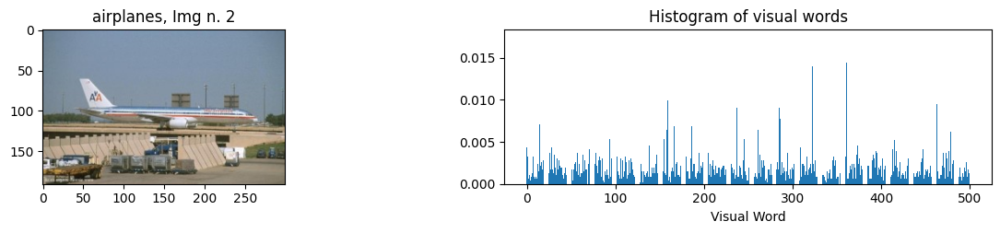

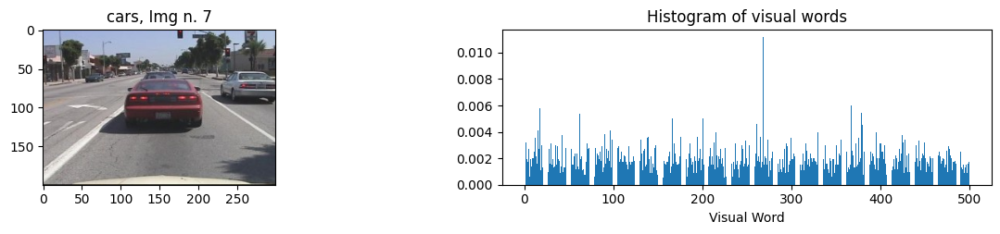

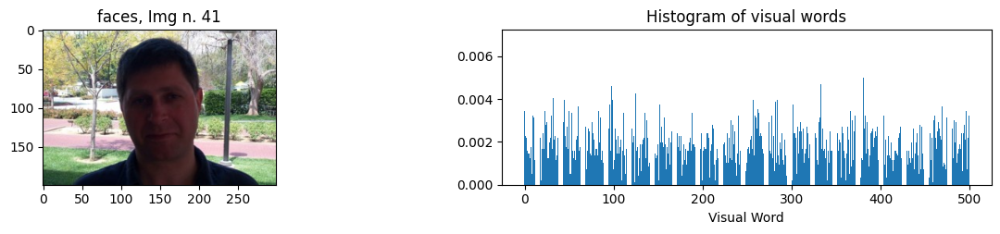

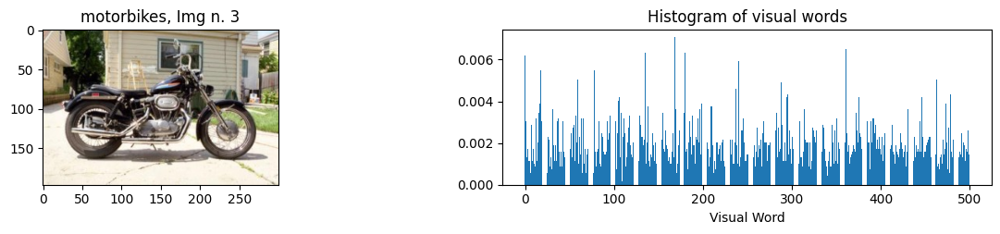

In [ ]:
i = 0
for idx_label in range(len(train_images)):

  # Select random image
  idx_img = np.random.randint(0, len(train_images[idx_label]))

  # Retrieve image
  img = train_images[idx_label][idx_img]

  # Retrieve bag-of-visual-words for the selected image
  h = bovw_train[idx_label][idx_img]

  _ = plt.figure(figsize=(15, 10))
  _ = plt.subplot(len(labels),2,i+1), plt.imshow(img), plt.title(f"{labels[idx_label]}, Img n. {idx_img}")
  _ = plt.subplot(len(labels),2,i+2), plt.bar(np.arange(n_visual_words), h.reshape(-1)), plt.title("Histogram of visual words"), plt.xlabel('Visual Word')
  i += 2

## **Classification**

Discriminative	methods:

*  k-NN;

*  SVM:	linear	and	non-linear	kernels	(RBF,	Intersection,	…).

Generative	methods:

*  Graphical models	(pLSA,	LDA,	…).

# **Ex. 3.a - NN classifier training**

Implement the nearest neighbour classifier.

**Steps:**
*   Compute pairwise Euclidean distances between each test and train histograms;

*   Compute the closest train histogram to each test histogram;

*   Retrieve the labels of the associated train histograms;



In [ ]:
# Matrix of bovw(s)
bovw_train_mat = []
bovw_test_mat = []

for idx_label in range(len(train_images)):
  for idx_image in range(len(train_images[idx_label])):
    bovw_train_mat.append(bovw_train[idx_label][idx_image])
bovw_train_mat = np.concatenate(bovw_train_mat)

for idx_label in range(len(test_images)):
  for idx_image in range(len(test_images[idx_label])):
    bovw_test_mat.append(bovw_test[idx_label][idx_image])
bovw_test_mat = np.concatenate(bovw_test_mat)

print(f"bovw_train_mat shape: {bovw_train_mat.shape}")
print(f"bovw_test_mat shape: {bovw_test_mat.shape}")


bovw_train_mat shape: (200, 500)
bovw_test_mat shape: (120, 500)


In [ ]:
# Tips:
# Variables to use: bovw_test_mat, bovw_train_mat, train_labels
# Create a "predictions" list containing the predictions for all the testing images

#############################
#                           #
#   WRITE YOUR CODE HERE    #
#                           #
#############################


* Confusion matrix for predictions and true labels

In [ ]:
print(f"predictions.shape: {predictions.shape}")
confusion_matrix = sklearn.metrics.confusion_matrix(test_labels, predictions)
print(f"\nConfusion matrix:\n\n{confusion_matrix}")

predictions.shape: (120,)

Confusion matrix:

[[17  8  1  4]
 [ 0 26  0  4]
 [ 0  0 27  3]
 [ 1  6  1 22]]


In [ ]:
accuracy = np.sum(np.diag(confusion_matrix)) / confusion_matrix.sum()
precision = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis = 0)
recall = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis = 1)
print(f"**** NN image classification (L2) ****")
print(f"Accuracy: {np.mean(accuracy):.3f}")
print(f"Precision: {np.mean(precision):.3f}")
print(f"Recall: {np.mean(recall):.3f}")

**** NN image classification (L2) ****
Accuracy: 0.767
Precision: 0.798
Recall: 0.767


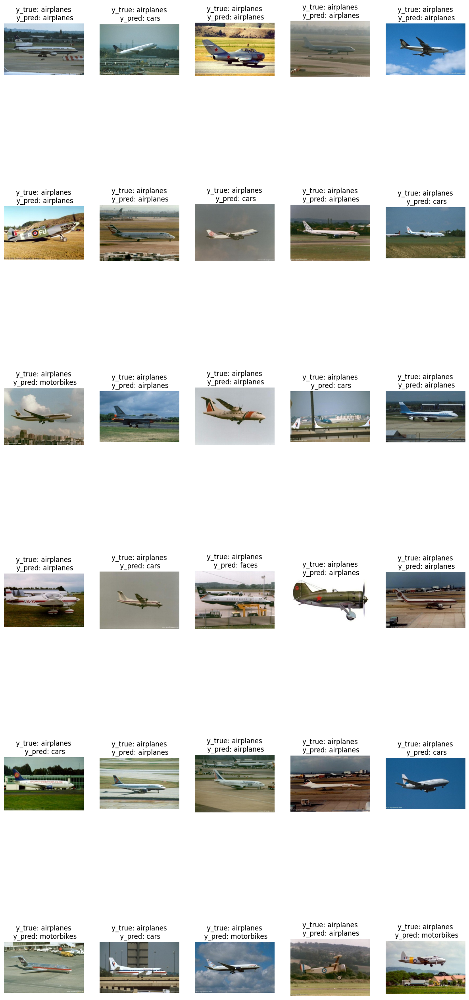

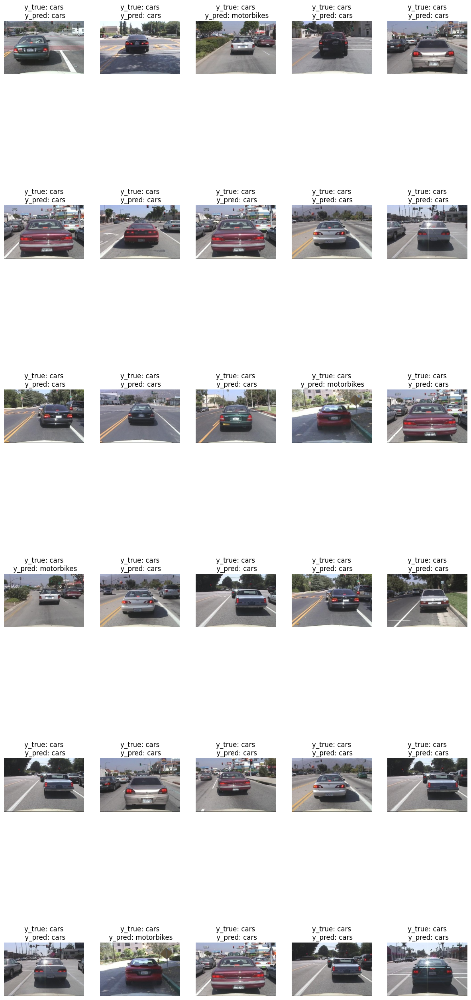

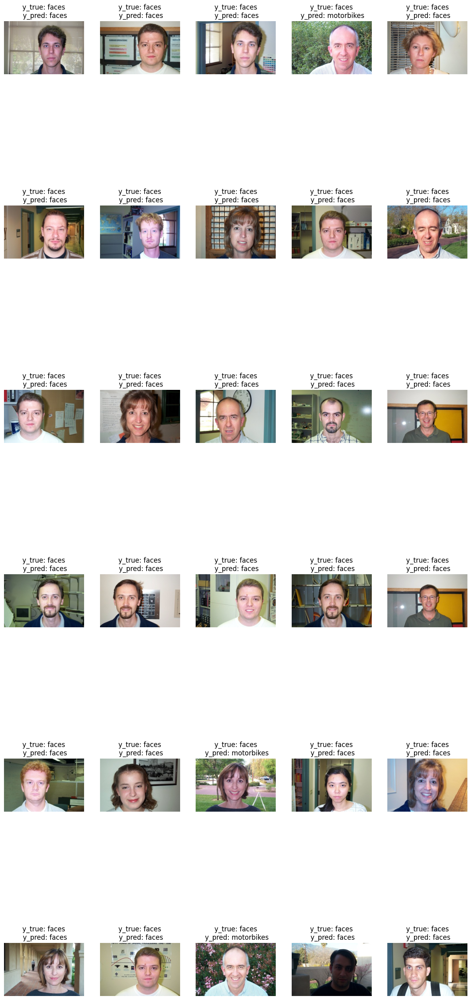

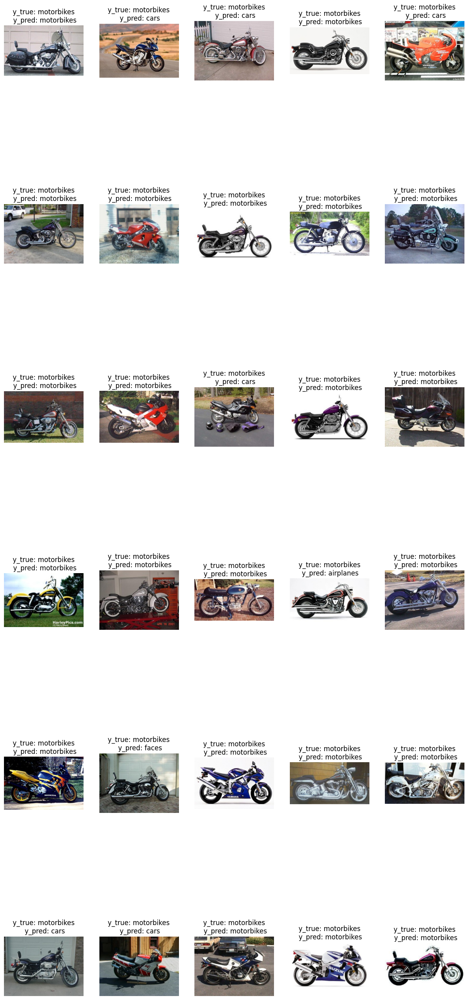

In [ ]:
i = 0
for label in range(len(test_images)):
  fig = plt.figure(figsize=(15, 35))
  fig.subplots_adjust(hspace=.2)
  p = 0
  for idx_image in range(len(test_images[label])):
    img = test_images[label][idx_image]
    plt.subplot(int(np.ceil(len(test_images[label])/5)), 5, p+1)
    plt.gca().set_title(f"y_true: {labels[test_labels[i]]}\n y_pred: {labels[predictions[i]]}")
    plt.imshow(img)
    plt.axis('off')
    i, p = i+1, p+1

# **Ex. 3.b**

Now, we will use the previous Nearest Neighbor image classification technique with a Chi2 distance instead of L2 distance. Chi-2 distance is defined as follows:

$~~~~~~~~~~~~X^2 = \frac{1}{2}\sum_{i=1}^n \frac{(x_i-y_i)^2}{(x_i+y_i)}$

Tip: You can use the "sklearn.metrics.pairwise_distances" providing the function "chi2_distance" as input metric parameter.

In [ ]:
# Function to calculate Chi-distance
def chi2_distance(A, B):
  eps = float_epsilon = np.finfo(float).eps
  A = A / (A.sum() + eps)
  B = B / (B.sum() + eps)
  # compute the chi-squared distance using above formula
  chi2_dist = 0.5 * np.sum([((a - b) ** 2) / (a + b + eps)
                      for (a, b) in zip(A, B)])
  return chi2_dist

In [ ]:
# Tip: use the previous code

#############################
#                           #
#   WRITE YOUR CODE HERE    #
#                           #
#############################


### Predictions

In [ ]:
print(f"predictions.shape: {predictions.shape}")
confusion_matrix = sklearn.metrics.confusion_matrix(test_labels, predictions)
print(f"\nConfusion matrix:\n\n{confusion_matrix}")

predictions.shape: (120,)

Confusion matrix:

[[18  7  1  4]
 [ 0 26  0  4]
 [ 0  0 24  6]
 [ 1  8  1 20]]


In [ ]:
accuracy = np.sum(np.diag(confusion_matrix)) / confusion_matrix.sum()
precision = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis = 0)
recall = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis = 1)
print(f"**** NN image classification (Chi2) ****")
print(f"Accuracy: {np.mean(accuracy):.3f}")
print(f"Precision: {np.mean(precision):.3f}")
print(f"Recall: {np.mean(recall):.3f}")

**** NN image classification (Chi2) ****
Accuracy: 0.733
Precision: 0.773
Recall: 0.733


# **K-NN Classifier (L2 distance)**

We will now implement a K-NN classifier using different values for the parameter k (e.g., 3) and compute the correponding accuracy, precision and recall. In this case, the k closest train histograms must be associated to each test histogram and the 'winner' selected using a majority voting procedure.

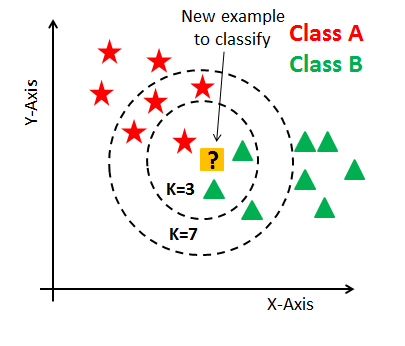

In [ ]:
k = 3  # Extract the k closest train histograms for each test histogram
closest_bovw = np.argpartition(dist_matrix_l2, kth=k, axis=1)[:, :k]
# Retrieve  corresponding labels
k_predictions = train_labels[closest_bovw]

predictions = []
for i in range(k_predictions.shape[0]):
  pred_i = k_predictions[i]
  # Majority voting
  counts = np.bincount(pred_i)
  predictions.append(np.argmax(counts))
predictions = np.asarray(predictions)

In [ ]:
confusion_matrix = sklearn.metrics.confusion_matrix(test_labels, predictions)

accuracy = np.sum(np.diag(confusion_matrix)) / confusion_matrix.sum()
precision = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis = 0)
recall = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis = 1)
print(f"**** k-NN image classification (k = {k}, L2) ****")
print(f"Accuracy: {np.mean(accuracy):.3f}")
print(f"Precision: {np.mean(precision):.3f}")
print(f"Recall: {np.mean(recall):.3f}\n")

**** k-NN image classification (k = 3, L2) ****
Accuracy: 0.742
Precision: 0.769
Recall: 0.742



# **k-NN classifier (Chi2 distance)**

k-NN image classification using Chi2 instead of L2 distance.

In [ ]:
k = 3
# Compute k closest train histograms for each test histogram
closest_bovw = np.argpartition(dist_matrix_chi2, kth=k, axis=1)[:, :k]
# Retrieve  corresponding labels
k_predictions = train_labels[closest_bovw]

predictions = []
for i in range(k_predictions.shape[0]):
  pred_i = k_predictions[i]
  # Majority voting
  counts = np.bincount(pred_i)
  predictions.append(np.argmax(counts))
predictions = np.asarray(predictions)

In [ ]:
confusion_matrix = sklearn.metrics.confusion_matrix(test_labels, predictions)

accuracy = np.sum(np.diag(confusion_matrix)) / confusion_matrix.sum()
precision = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis = 0)
recall = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis = 1)
print(f"**** k-NN image classification (k = {k}, Chi2) ****")
print(f"Accuracy: {np.mean(accuracy):.3f}")
print(f"Precision: {np.mean(precision):.3f}")
print(f"Recall: {np.mean(recall):.3f}\n")

**** k-NN image classification (k = 3, Chi2) ****
Accuracy: 0.717
Precision: 0.753
Recall: 0.717



*   C-Support Vector Classification

In [ ]:
# Train SVM classifier
from sklearn import svm
clf = svm.SVC(kernel='rbf')
clf.fit(bovw_train_mat, train_labels)
predictions = clf.predict(bovw_test_mat)

In [ ]:
confusion_matrix = sklearn.metrics.confusion_matrix(test_labels, predictions)

accuracy = np.sum(np.diag(confusion_matrix)) / confusion_matrix.sum()
precision = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis = 0)
recall = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis = 1)
print(f"**** C-Support Vector Classification ****")
print(f"Accuracy: {np.mean(accuracy):.3f}")
print(f"Precision: {np.mean(precision):.3f}")
print(f"Recall: {np.mean(recall):.3f}\n")

**** C-Support Vector Classification ****
Accuracy: 0.858
Precision: 0.860
Recall: 0.858



# **Dense SIFT (Optional)**

With Dense SIFT you get a SIFT descriptor at every location of a grid, while with standard SIFT descriptors at locations determined by Lowe's algorithm.

**Steps:**

*  Define step_size and feature_scale (e.g., step_size=5, feature_scale=5);
*  Create a grid for the input image using the above parameters;
*  Create a list of keypoints using the method 'cv2.Keypoint()'. As input parameters use x and y coordinates of each point of the grid and size of the keypoint (feature_scale paramater);
*  Use the sift.Compute() method to compute the descriptors associated to the keypoints previously created. As input parameters use the image and the list of keypoints;


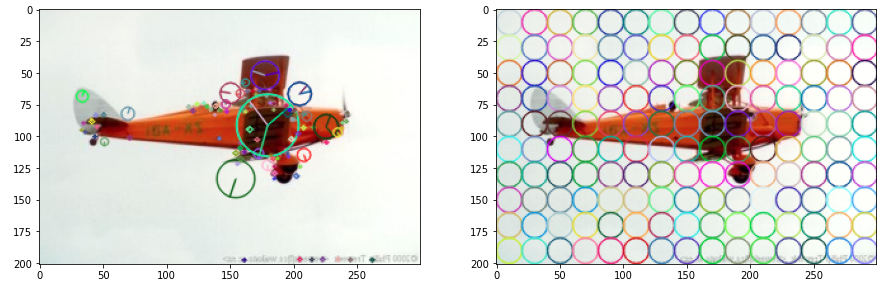

In [ ]:
class DenseSIFT():
  '''
  Dense SIFT class implementation.
  It return detected keypoints and descriptors.

  Note: run this cell before extracting the dense features.
  '''

  def __init__(self, detector, step_size=20, feature_scale=20):
      self.detector = detector
      self.step_size = step_size
      self.feature_scale = feature_scale

  def detectAndCompute(self, img):
      keypoints = []
      rows, cols = img.shape[:2]
      for x in range(self.feature_scale//2, cols, self.step_size):
          for y in range(self.feature_scale//2, rows, self.step_size):
              keypoints.append(cv2.KeyPoint(float(x), float(y), self.feature_scale))
      kps, des = sift.compute(img, keypoints)
      return kps, des

# **Dense SIFT results**

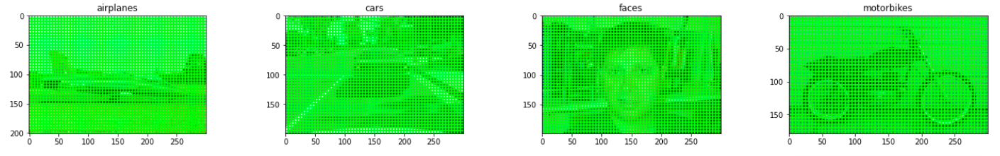

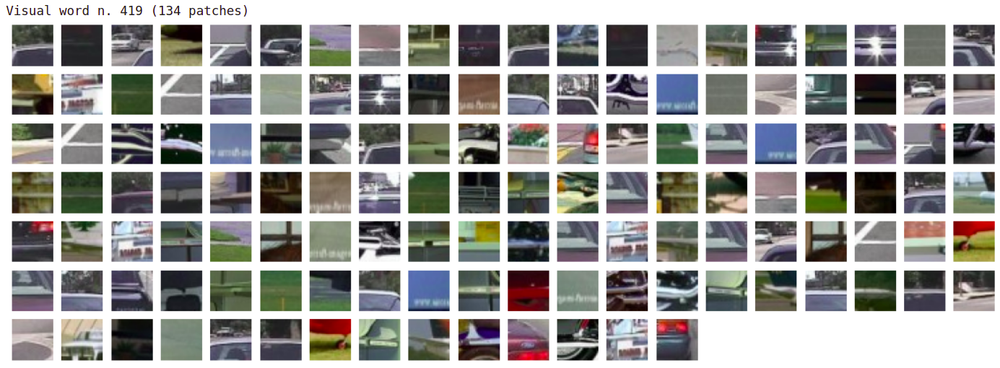

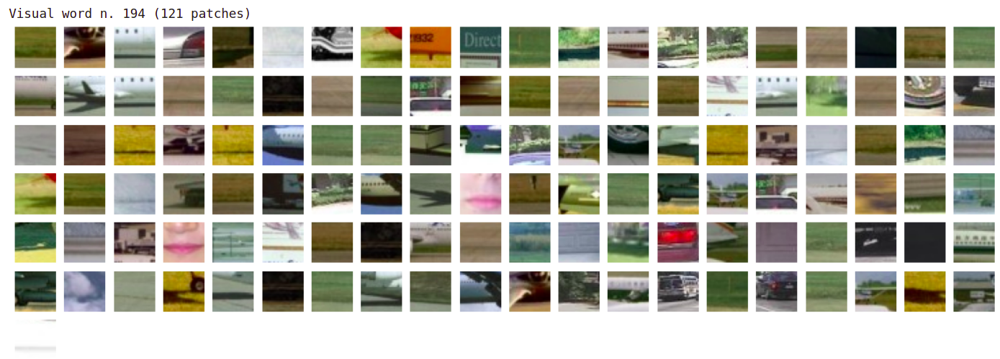

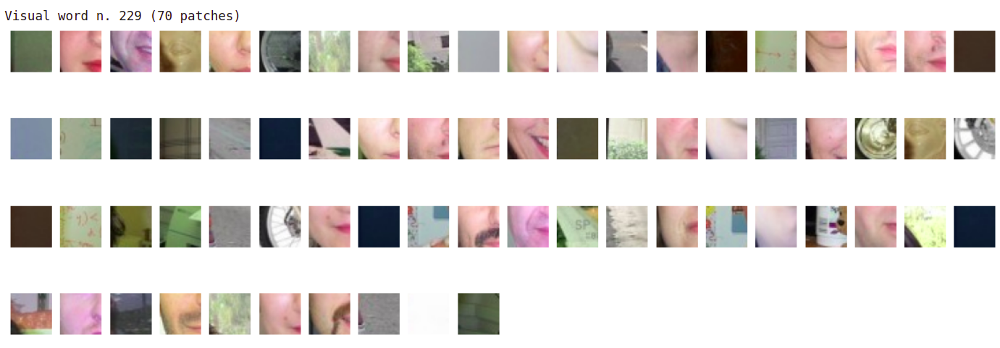

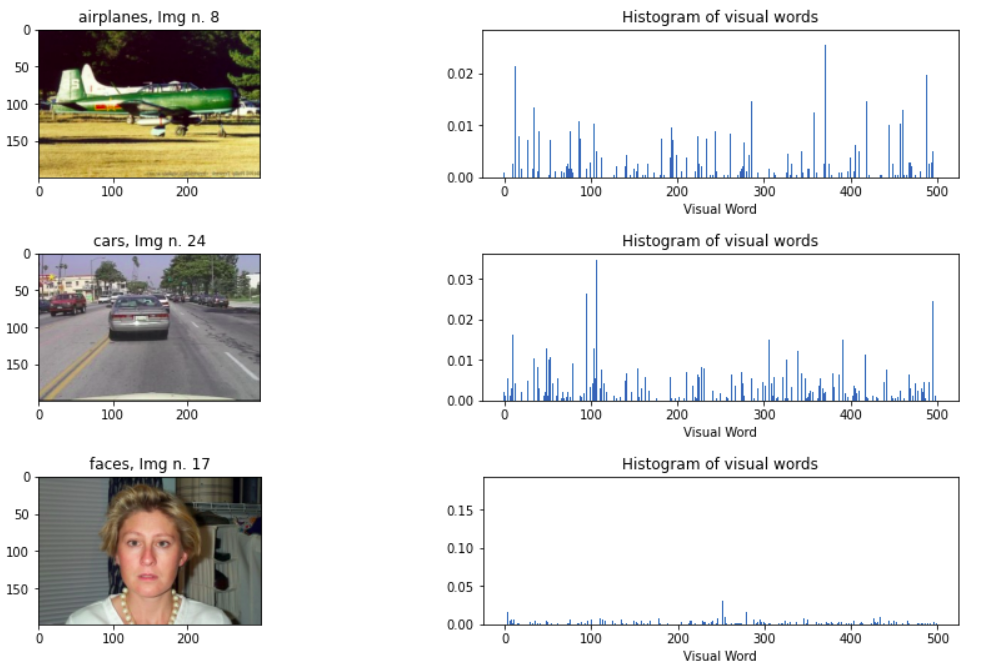

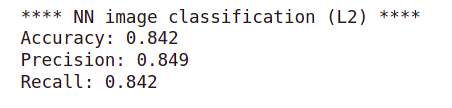

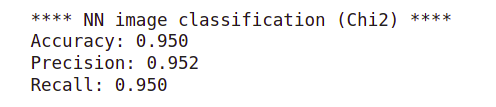

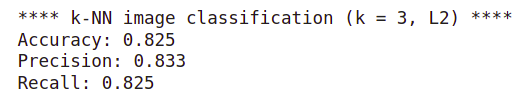

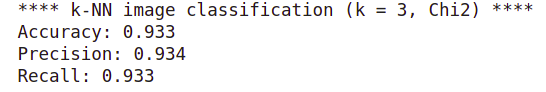

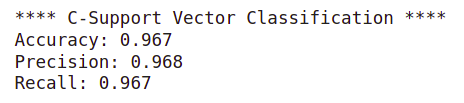

## Optional exercises

*   What is the impact of the number of visual words on the results?
*   Select different parameters for the SIFT algorithm.
*   Use a different feature detector.
*   Select a greater number of descriptors to be used for the clustering algorithm.

*   To apply the BOW pipeline to the dataset containing 15 classes, load the '15_ObjectCategories.zip' file and use ``` !unzip 15_ObjectCategories.zip ``` and ``` images_folder = './15_ObjectCategories' ```.